## Setup

In [55]:
%pip install -qq -r requirements.txt
%env PYTORCH_ENABLE_MPS_FALLBACK=1
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

Note: you may need to restart the kernel to use updated packages.
env: PYTORCH_ENABLE_MPS_FALLBACK=1


In [56]:
import torch
import torchvision
import matplotlib.pyplot as plt
import numpy as np
import annotation_parser
import time
from torchvision import transforms
from torch import nn
import PIL
from PIL import Image
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## Utils

In [138]:
def plot_img(rows: int, cols: int, normalize=True, *args):
    plt.gcf().set_dpi(300)
    # plt.subplots_adjust(left=0.1,
    #                 bottom=0.1,
    #                 right=0.9,
    #                 top=0.3,
    #                 wspace=0.4,
    #                 hspace=0.2)
    plt.subplots_adjust(left=0.1,
                bottom=0.05,
                right=0.9,
                top=0.3,
                wspace=0.1,
                hspace=0.2)
    for i, arg in enumerate(args):
        plt.subplot(rows, cols, i+1)
        plt.axis("off")
        if type(arg) == torch.Tensor:
            if len(arg.shape) == 2:
                if normalize:
                    arg = torch.clone(arg)
                    arg /= arg.max()
                plt.imshow(arg.cpu().detach().numpy())
            else:
                if normalize:
                    arg -= arg.min(1, keepdim=True)[0]
                    arg /= arg.max(1, keepdim=True)[0]
                    arg = np.moveaxis(arg.detach().cpu().numpy(), 0, -1)
                    plt.imshow(arg)
                else:
                    plt.imshow(arg.permute(1, 2, 0).numpy())
        elif type(arg) == np.ndarray:
            if normalize:
                arg *= (255.0/arg.max())
                arg += arg.min()
                plt.imshow(arg/255)
            else:
                plt.imshow(arg)
        elif type(arg) == PIL.JpegImagePlugin.JpegImageFile:
            plt.imshow(arg)
    plt.show()

In [58]:
def normalize_img(img):
    # Normalize image to between 0 and 1
    img *= (255.0/img.max())
    img += img.min()
    return img/255

In [59]:
import itertools
def _mix(pairs: list[tuple], label: str) -> list[tuple]:
    l = [pair[0] for pair in pairs]
    r = [pair[1] for pair in pairs]

    return [(l, r, label) for l, r in list(itertools.product(l, r, repeat=1))]

## Network

### Data loader

In [60]:
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import random

class CalvingDataLoader(Dataset):
    split = 0.8
    content_root = '/Users/lakhanmankani/Desktop/dataset/July-2016/processed/usable/'
    transform = transforms.Compose([
            transforms.Resize((68, 500)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    random_transform = transforms.Compose([
                    transforms.RandomHorizontalFlip(),
                    transforms.RandomPerspective(0.2),
                    transforms.RandomRotation(6)
    ])
    SEED = 20
    def __init__(self, train=True, annotated=True, split=split, content_root=content_root, 
                 annotations_file='july_annotations_v2.xml', augement=True, enhanced=True) -> None:
        self.split = split
        self.content_root = content_root
        self.calving_pairs = annotation_parser.get_calving_pairs(annotations_file)
        if enhanced:
            self.calving_pairs = annotation_parser.get_calving_pairs_augmented(annotations_file)
        else:
            self.calving_pairs = annotation_parser.get_calving_pairs(annotations_file)
        random.seed(self.SEED)
        random.shuffle(self.calving_pairs)
        random.seed()
        
        if annotated:
            # Only use labeled images
            self.calving_pairs = [x for x in self.calving_pairs if x[2] != 'Unlabeled']
        
        if train:
            self.calving_pairs = self.calving_pairs[:int(self.split*len(self.calving_pairs))]
        else:
            self.calving_pairs = self.calving_pairs[int(self.split*len(self.calving_pairs)):]
        
        # if enhanced:
        #     non_calvings = [x for x in self.calving_pairs if 'No calving' in x]
        #     calvings = [x for x in self.calving_pairs if 'Calving' in x]
            
        #     self.calving_pairs = _mix(calvings, 'Calving') + non_calvings

        self.augment = augement
    
    def __getitem__(self, idx) -> tuple[torch.Tensor, torch.Tensor, str]:
        l, r, label = self.calving_pairs[idx]
        l = self.transform(Image.open(self._get_file_name(l)))
        r = self.transform(Image.open(self._get_file_name(r)))
        if self.augment:
            # Batch before transformation to apply same transformation to pair
            batch = self.random_transform(torch.stack([l, r]))
            l, r = batch[0], batch[1]
        return l, r, label #type:ignore
    
    def __len__(self):
        return len(self.calving_pairs)
    
    def _get_file_name(self, path: str) -> str:
        return self.content_root+path.split('/')[-1]
    
    def get_weights(self):
        labels = [x[2] for x in self.calving_pairs]
        classes, counts = np.unique(labels, return_counts=True)
        weight_map = {}
        for i in range(len(classes)):
            weight_map[classes[i]] = 1/counts[i]
        weights = [weight_map[x] for x in labels]
        return weights

In [61]:
batch_size = 4

train_data = CalvingDataLoader(train=True, augement=True, enhanced=True)
train_sampler = WeightedRandomSampler(train_data.get_weights(), num_samples=len(train_data))
train_loader = DataLoader(train_data, batch_size=batch_size, sampler=train_sampler)
unweighted_train_loader = DataLoader(train_data, batch_size=batch_size)

test_data = CalvingDataLoader(train=False, augement=False, enhanced=False)
test_sampler = WeightedRandomSampler(test_data.get_weights(), num_samples=len(test_data))
test_loader = DataLoader(test_data, batch_size=1, sampler=test_sampler)
unweighted_test_loader = DataLoader(test_data, batch_size=1)

unseen_data = CalvingDataLoader(train=True, split=1, content_root='/Users/lakhanmankani/Desktop/dataset/August-2016/processed/usable/', 
                                annotations_file='august_annotations.xml', augement=False, enhanced=False)
unseen_sampler = WeightedRandomSampler(unseen_data.get_weights(), num_samples=len(unseen_data))
unseen_loader = DataLoader(unseen_data, batch_size=1, sampler=unseen_sampler)
unweighted_unseen_loader = DataLoader(unseen_data, batch_size=1)


In [62]:
print(f'train data calvings: {100*len([x for x in train_data.calving_pairs if x[2] == "Calving"])/len(train_data):.2f}%')
print(f'test data calvings: {100*len([x for x in test_data.calving_pairs if x[2] == "Calving"])/len(test_data):.2f}%')
print(f'unseen data calvings: {100*len([x for x in unseen_data.calving_pairs if x[2] == "Calving"])/len(unseen_data):.2f}%')

train data calvings: 86.80%
test data calvings: 10.77%
unseen data calvings: 12.00%


In [63]:
no_calving_test = (train_data.transform(Image.open(train_data.content_root+'20160709_1723_IMG_4311.JPG')),
                   train_data.transform(Image.open(train_data.content_root+'20160709_1738_IMG_4312.JPG')),
                   'No calving'
                   )

calving_test = (train_data.transform(Image.open(train_data.content_root+'20160713_0108_IMG_4630.JPG')),
                train_data.transform(Image.open(train_data.content_root+'20160713_0123_IMG_4631.JPG')),
                'Calving'
                )

## Siamese

In [64]:
device = 'mps'

In [65]:
class SiameseNetwork(nn.Module):
    def __init__(self) -> None:
        super().__init__()
        self.vgg = torchvision.models.vgg11(weights=torchvision.models.VGG11_Weights.IMAGENET1K_V1)
        self.vggFeatures = self.vgg.features
        for param in self.vgg.parameters():
            param.requires_grad = False
        # self.vgg.classifier = self.vgg.classifier[:-1]
        # self.vgg.classifier[6] = nn.Linear(4096, 64)

        self.linear1 = nn.Linear(512*15*2*2, 128)
        # self.linear2 = nn.Linear(128, 32)
        self.linear3 = nn.Linear(128, 1)
        self.relu = nn.ReLU()

    
    def forward(self, l, r):
        l = self.vggFeatures(l)
        l = l.flatten(start_dim=1)
        r = self.vggFeatures(r)
        r = r.flatten(start_dim=1)
        
        # x = torch.cdist(l, r)
        
        x = torch.concat((l, r), dim=1)
        # x = x.flatten(start_dim=1)
        x = self.linear1(x)
        x = self.relu(x)
        # x = self.linear2(x)
        # x = self.relu(x)
        x = self.linear3(x)

        return x

net = SiameseNetwork()
net.load_state_dict(torch.load('v2.pth'))
_ = net.to(device)

In [66]:
lr = 3e-4
optimizer = torch.optim.Adam(net.parameters(), lr)
# optimizer = torch.optim.SGD(net.parameters(), lr)
loss_fn = nn.BCELoss()
sigmoid = nn.Sigmoid()


In [67]:
def train(dataloader: DataLoader, net: SiameseNetwork, loss_fn: nn.BCELoss, optimizer: torch.optim.Optimizer):
    size = len(dataloader.dataset)
    net.train()
    for batch, (left, right, labels) in enumerate(dataloader):
        left = left.to(device) # B x 3 x 224 x 224
        right = right.to(device) # B x 3 x 224 x 224
        labels = torch.tensor([0 if x == 'No calving' else 1 for x in labels]).to(device).type(torch.float) # B
        
        output = sigmoid(net.forward(left, right)).flatten().type(torch.float) # B x 2
        #print(output.type(torch.bool))
        loss = loss_fn(output, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if batch % (len(dataloader) // 3) == 0:
            loss, current = loss.item(), batch * batch_size
            print(f'loss: {loss:>7f}  [{current:>5d}/{size:>5d}]')

In [68]:
def test(dataloader: DataLoader, net: SiameseNetwork, loss_fn: nn.BCELoss):
  size = len(dataloader.dataset)
  net.eval()
  test_loss, correct = 0, 0

  all_labels = np.array([])
  all_preds = np.array([])
  
  with torch.no_grad():
    for (left, right, labels) in dataloader:
      left, right = left.to(device), right.to(device)
      labels = torch.tensor([0 if x == 'No calving' else 1 for x in labels]).to(device).type(torch.float)
      #pred = net(left, right).flatten().type(torch.float).sign().relu()
      pred = net(left, right).flatten().type(torch.float)
      test_loss += loss_fn(pred.sigmoid(), labels).item()
      correct += (pred.sign().relu() == labels).type(torch.float).sum().item()

      all_labels = np.append(all_labels, labels.detach().cpu().numpy())
      all_preds = np.concatenate([all_preds, pred.sign().relu().detach().cpu().numpy()])
  test_loss /= size
  correct /= size
  matrix = confusion_matrix(all_labels, all_preds)
  print(f"Test Error: \n Accuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f}, TN: {100*matrix[0][0]/sum(matrix[0]):>0.1f}%, TP: {(100*matrix[1][1]/sum(matrix[1])):>0.1f}% \n")
  return correct, test_loss, matrix
  

In [69]:
net.train()
EPOCHS = 10
hof = []
losses = []
accuracies = []
matrices = []
for epoch in range(EPOCHS):
    print(f"Epoch {epoch+1}\n-------------------------------")
    # t1 = time.time()
    train(train_loader, net, loss_fn, optimizer)
    accuracy, test_loss, matrix = test(unweighted_test_loader, net, loss_fn)
    tn = matrix[0][0]/sum(matrix[0])
    tp = matrix[1][1]/sum(matrix[1])
    
    if tp >= 0.5 and tn >= 0.5:
        hof.append((accuracy, tn, tp, net.state_dict()))
    accuracies.append(accuracy)
    losses.append(test_loss)
    matrices.append(matrix)
    # t2 = time.time()
    # print(f'{t2-t1:.3f}s')
print(f'best weights {[(acc, tn, tp) for acc, tn, tp, _ in hof]}')
if len(hof) != 0:
    best_acc, best_tn, best_tp, best_weights = hof[np.argmax([tn+2*tp for _, tn, tp, _ in hof])]
    net.load_state_dict(best_weights)
    print(f'Loading best weights with {best_acc*100:.2f}% accuracy, {best_tn*100:.2f}% TN, {best_tp*100:.2f}% TP')

Epoch 1
-------------------------------
loss: 0.652218  [    0/ 3545]
loss: 0.664676  [ 1180/ 3545]
loss: 0.492758  [ 2360/ 3545]
loss: 0.523593  [ 3540/ 3545]
Test Error: 
 Accuracy: 78.5%, Avg loss: 0.464367, TN: 79.3%, TP: 71.4% 

Epoch 2
-------------------------------
loss: 0.667569  [    0/ 3545]
loss: 0.370214  [ 1180/ 3545]
loss: 0.890986  [ 2360/ 3545]
loss: 0.222109  [ 3540/ 3545]
Test Error: 
 Accuracy: 90.8%, Avg loss: 0.263327, TN: 94.8%, TP: 57.1% 

Epoch 3
-------------------------------
loss: 0.276205  [    0/ 3545]
loss: 0.468783  [ 1180/ 3545]
loss: 1.000103  [ 2360/ 3545]
loss: 0.283896  [ 3540/ 3545]
Test Error: 
 Accuracy: 95.4%, Avg loss: 0.170947, TN: 100.0%, TP: 57.1% 

Epoch 4
-------------------------------
loss: 0.048329  [    0/ 3545]
loss: 0.331739  [ 1180/ 3545]
loss: 0.341796  [ 2360/ 3545]
loss: 0.147620  [ 3540/ 3545]
Test Error: 
 Accuracy: 92.3%, Avg loss: 0.206514, TN: 94.0%, TP: 78.6% 

Epoch 5
-------------------------------
loss: 0.162721  [    0/

In [103]:
print(f'best weights {[(acc, tn, tp) for acc, tn, tp, _ in hof]}')
if len(hof) != 0:
    best_acc, best_tn, best_tp, best_weights = hof[np.argmax([tn+2*tp for _, tn, tp, _ in hof])]
    net.load_state_dict(best_weights)
    print(f'Loading best weights with {best_acc*100:.2f}% accuracy, {best_tn*100:.2f}% TN, {best_tp*100:.2f}% TP')

best weights [(0.7846153846153846, 0.7931034482758621, 0.7142857142857143), (0.9076923076923077, 0.9482758620689655, 0.5714285714285714), (0.9538461538461539, 1.0, 0.5714285714285714), (0.9230769230769231, 0.9396551724137931, 0.7857142857142857), (0.9153846153846154, 0.9137931034482759, 0.9285714285714286), (0.9153846153846154, 0.9310344827586207, 0.7857142857142857), (0.9, 0.8879310344827587, 1.0), (0.9230769230769231, 0.9137931034482759, 1.0), (0.9461538461538461, 0.9655172413793104, 0.7857142857142857), (0.9153846153846154, 0.9310344827586207, 0.7857142857142857)]
Loading best weights with 92.31% accuracy, 91.38% TN, 100.00% TP


Test Error: 
 Accuracy: 94.0%, Avg loss: 0.038798, TN: 92.4%, TP: 95.5% 



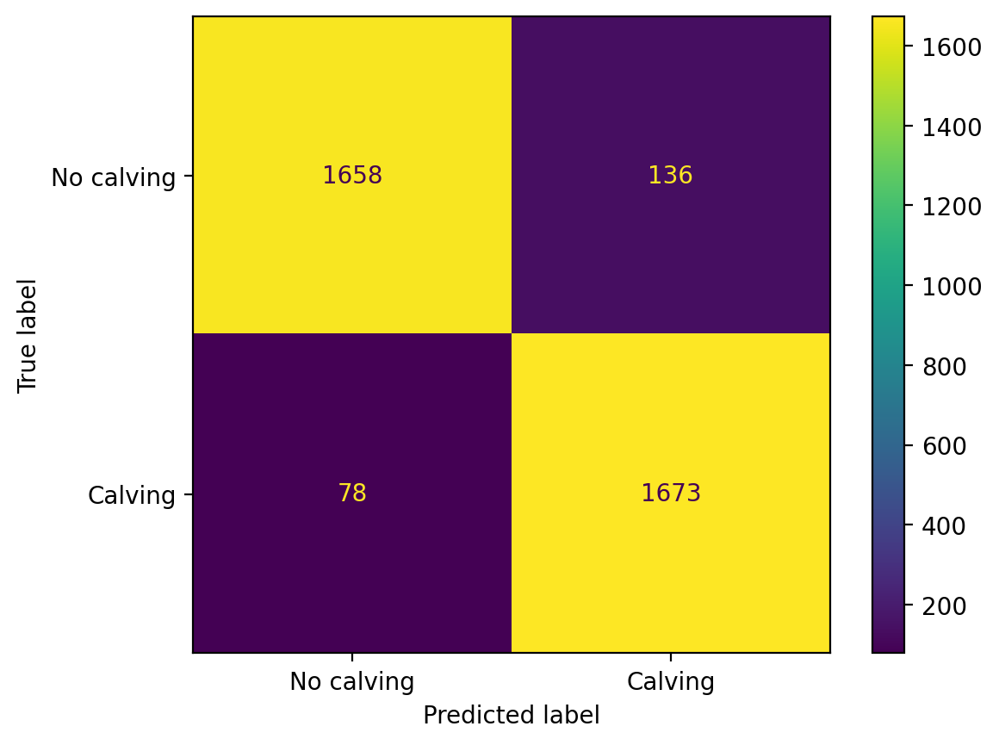

In [144]:
_, _, matrix = test(train_loader, net, loss_fn)
cm_display = ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels = ["No calving", "Calving"])
cm_display.plot()

Test Error: 
 Accuracy: 91.5%, Avg loss: 0.138386, TN: 93.1%, TP: 78.6% 



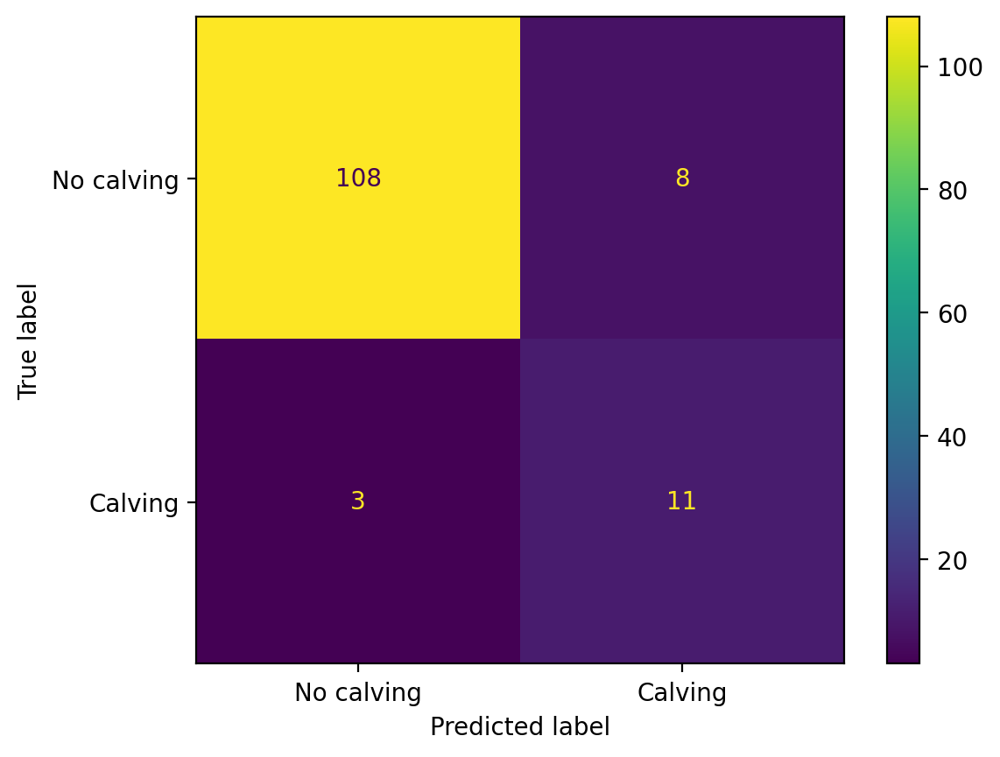

In [146]:
_, _, matrix = test(unweighted_test_loader, net, loss_fn)
cm_display = ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels = ["No calving", "Calving"])
cm_display.plot()
plt.savefig('confusion-matrix.png', dpi=300)

In [142]:
# torch.save(net.state_dict(), 'out_v2.pkl')

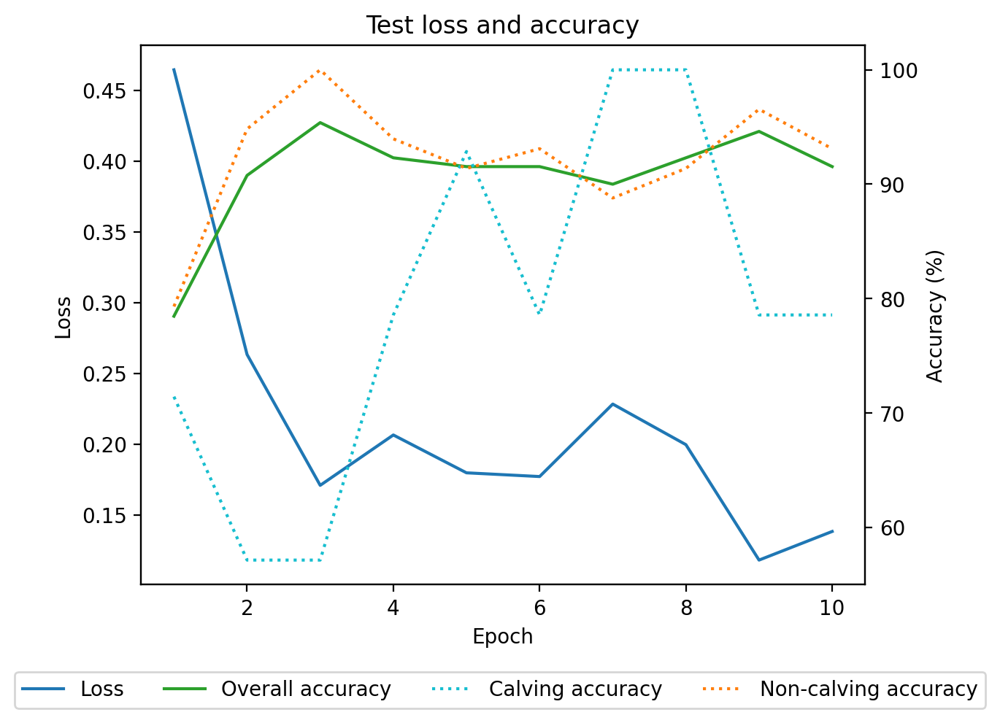

In [303]:
import seaborn as sns
# ax = sns.lineplot({'loss': losses}, color='g', legend=False)
plt.title('Test loss and accuracy')
ax = plt.plot(range(1,11), losses, color='tab:blue', label='Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
ax2 = plt.twinx()
# sns.lineplot({'accuracy': np.array(accuracies)*100}, ax=ax2, color='tab:orange', legend=False)
plt.plot(range(1,11), np.array(accuracies)*100, color='tab:green', label='Overall accuracy')
plt.ylabel('Accuracy (%)')

plt.plot(range(1,11), tps, ':', label='Calving accuracy', color='tab:cyan')
plt.plot(range(1,11), tns, ':',label='Non-calving accuracy', color='tab:orange')

# plt.axvline(np.argmax([tn+2*tp for _, tn, tp, _ in hof])+1, linestyle='--',label='Best epoch', color='tab:red')

#leg = ax2.figure.legend(bbox_to_anchor=(1.35, 0.9))
leg = ax2.figure.legend(bbox_to_anchor=(1.04, -0.0), ncol=4)
#ax[0].figure.savefig('test.png')
plt.savefig('training-loss-accuracy.png', dpi=300, bbox_extra_artists=(leg,), bbox_inches='tight')

Test Error: 
 Accuracy: 82.0%, Avg loss: 0.588286, TN: 89.5%, TP: 26.7% 



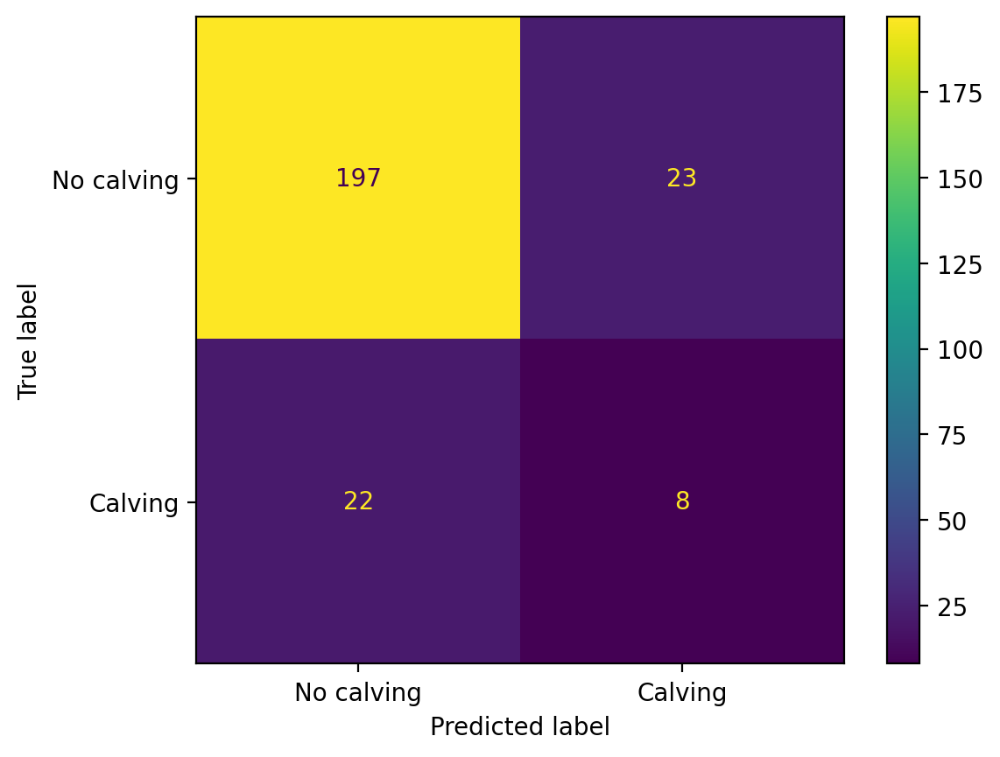

In [304]:
_, _, matrix = test(unweighted_unseen_loader, net, loss_fn)
cm_display = ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels = ["No calving", "Calving"])
cm_display.plot()
plt.savefig('august-confusion-matrix.png', dpi=300)

In [319]:
net.eval()
incorrect: list[int] = []
calving_losses: list[float] = []
areas = [4695.2096, 2906.1810000000064, 5580.297599999996, 15320.064599999996, 3246.534599999995, 3217.1072999999974, 23951.633999999987, 3986.695000000006, 7509.376000000012, 4768.407800000016, 4675.290099999998, 3476.1237999999976, 8452.3244, 5857.982500000001]
preds = []
trues = []
with torch.no_grad():
    for i, (left, right, labels) in enumerate(DataLoader(unseen_data, batch_size=1, shuffle=False)):
      left, right = left.to(device), right.to(device)
      labels = torch.tensor([0 if x == 'No calving' else 1 for x in labels]).to(device).type(torch.float)
      trues.append(labels.item())

      # pred = net(left, right).flatten().type(torch.float)
      # test_loss += loss_fn(pred.sigmoid(), labels).item()
      # correct += (pred.sign().relu() == labels).type(torch.float).sum().item()

      pred = net(left, right).flatten().type(torch.float)#.sign().relu()
      if labels[0] == 1:
        calving_losses.append(loss_fn(pred.sigmoid(), labels).item())
      # print(list(zip(labels, pred)), pred == labels)
      if pred.sign().relu() != labels:
         incorrect.append(i)
      preds.append(pred.sign().relu().item())


In [320]:
from sklearn.metrics import f1_score
f1_score(trues, preds)

0.26229508196721313

In [311]:
from scipy.stats import pearsonr
pearsonr(areas, calving_losses)

PearsonRResult(statistic=-0.1894241996598292, pvalue=0.5166011422375294)

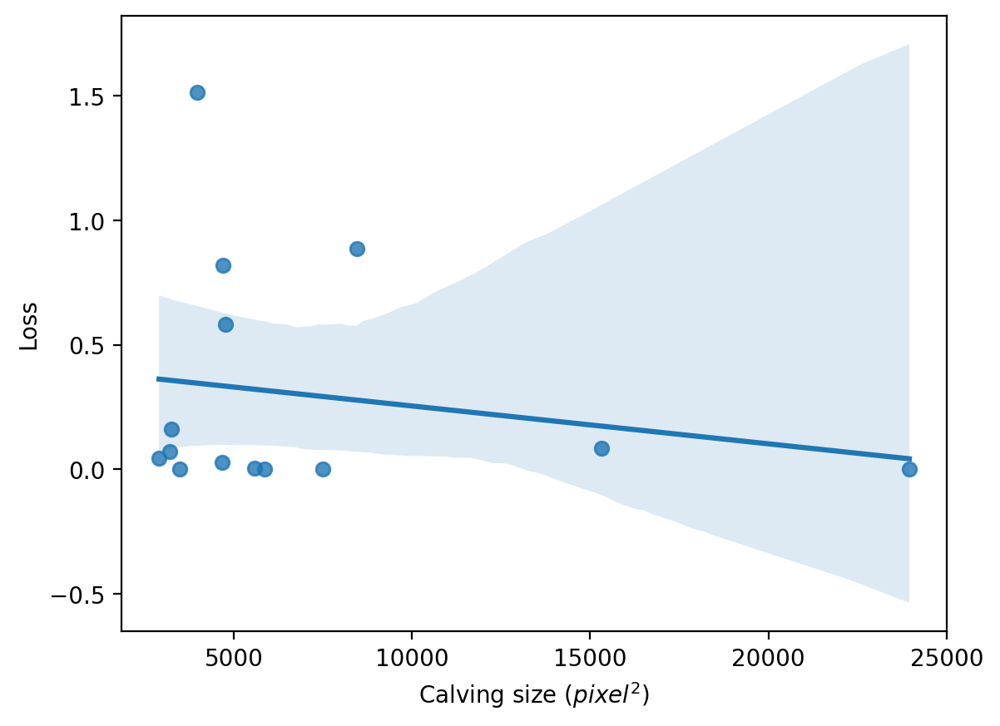

In [312]:
#plt.plot(list(zip(areas, losses)))
# sns.scatterplot({'area (px^2)': areas, 'loss': losses}, x='area (px^2)', y='loss')
ax = sns.regplot(data={'calving size': np.array(areas), 'loss': np.array(calving_losses)}, x='calving size', y='loss')
ax.set(xlabel='Calving size ($pixel^2$)', ylabel='Loss')
#plt.xlabel("Calving size")
# sns.displot({'area (px^2)': areas, 'loss': losses}, x='area (px^2)', kind='kde')
pearsonr(areas, calving_losses)
plt.savefig('calving-size-vs-loss.png', dpi=300)

In [187]:
test_data.calving_pairs[0]

('20160709_0853_IMG_4277.JPG', '20160709_0908_IMG_4278.JPG', 'No calving')

In [148]:
incorrect

[0, 3, 4, 41, 51, 85, 89, 94, 106, 112, 126]

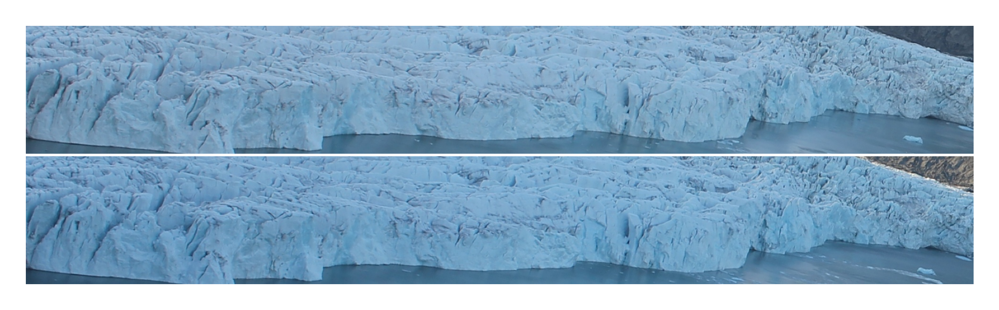

In [175]:
plt.figure(figsize=(12, 20), dpi=300)
plt.subplots_adjust(left=0.1,
                bottom=0.05,
                right=0.6,
                top=0.1,
                wspace=0.01,
                hspace=0.02)
for i, n in enumerate([1]): # [1,8]
    l, r, label = test_data.calving_pairs[incorrect[n]]
    # print(l, r, label)
    l = Image.open(train_data.content_root+l)
    r = Image.open(train_data.content_root+r)
    plt.subplot(2,1, 2*i+1)
    plt.axis("off")
    plt.imshow(l)
    plt.subplot(2,1, 2*i+2)
    plt.axis("off")
    plt.imshow(r)
plt.savefig('failure-missed-calving.png')

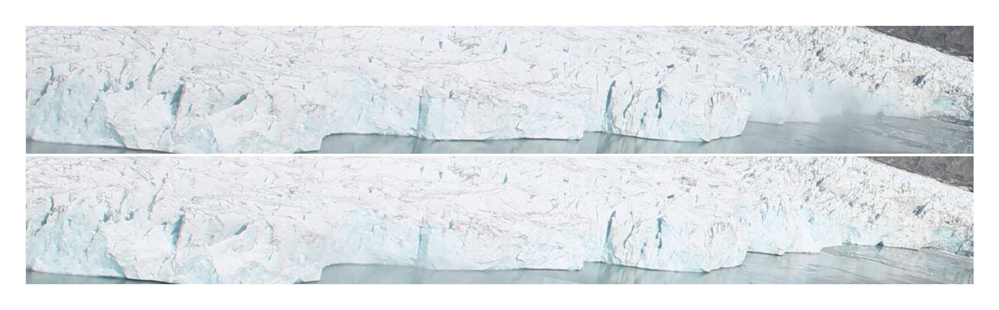

In [177]:
plt.figure(figsize=(12, 20), dpi=300)
plt.subplots_adjust(left=0.1,
                bottom=0.05,
                right=0.6,
                top=0.1,
                wspace=0.01,
                hspace=0.02)
for i, n in enumerate([8]): # [1,8]
    l, r, label = test_data.calving_pairs[incorrect[n]]
    # print(l, r, label)
    l = Image.open(train_data.content_root+l)
    r = Image.open(train_data.content_root+r)
    plt.subplot(2,1, 2*i+1)
    plt.axis("off")
    plt.imshow(l)
    plt.subplot(2,1, 2*i+2)
    plt.axis("off")
    plt.imshow(r)
plt.savefig('failure-missed-non-calving.png')

20160709_0853_IMG_4277.JPG 20160709_0908_IMG_4278.JPG No calving
20160707_0008_IMG_4050.JPG 20160707_0023_IMG_4051.JPG Calving
20160709_0023_IMG_4243.JPG 20160709_0038_IMG_4244.JPG No calving
20160708_1108_IMG_4190.JPG 20160708_1123_IMG_4191.JPG No calving
20160708_0508_IMG_4166.JPG 20160708_0523_IMG_4167.JPG No calving
20160706_1838_IMG_4028.JPG 20160706_1853_IMG_4029.JPG Calving
20160708_0138_IMG_4152.JPG 20160708_0153_IMG_4153.JPG No calving
20160708_1138_IMG_4192.JPG 20160708_1153_IMG_4193.JPG No calving
20160701_1303_IMG_3523.JPG 20160701_1318_IMG_3524.JPG No calving
20160709_0938_IMG_4280.JPG 20160709_0953_IMG_4281.JPG No calving
20160705_2208_IMG_3946.JPG 20160705_2223_IMG_3947.JPG Calving


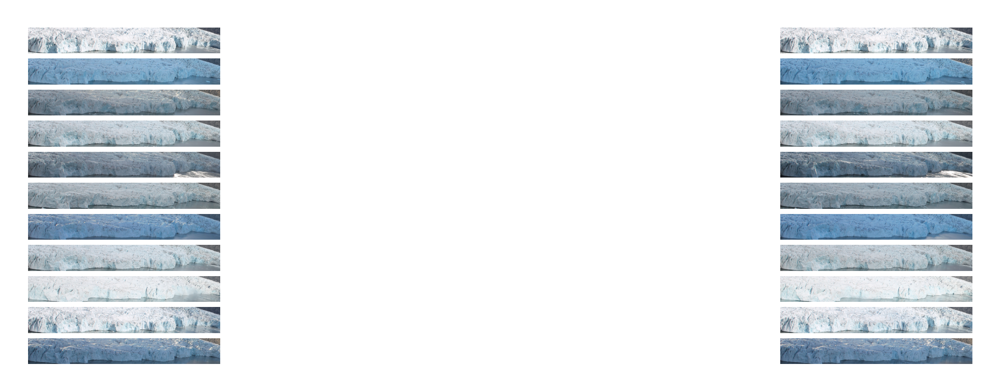

In [149]:
plots = []
for i, j in enumerate(incorrect):
    l, r, label = test_data.calving_pairs[j]
    print(l, r, label)
    l = Image.open(train_data.content_root+l)
    r = Image.open(train_data.content_root+r)
    plots.append(l)
    plots.append(r)
plot_img(len(incorrect), 2, False, *plots)

In [78]:
l, r, label = no_calving_test
l, r, label = torch.stack([l]).to(device), torch.stack([r]).to(device), torch.tensor([0]).type(torch.float).to(device)

loss_fn(net.forward(l, r).flatten().type(torch.float).sigmoid(), label)

tensor(0.0026, device='mps:0', grad_fn=<BinaryCrossEntropyBackward0>)

In [79]:
l, r, label = calving_test
l, r, label = torch.stack([l]).to(device), torch.stack([r]).to(device), torch.tensor([1]).type(torch.float).to(device)

loss_fn(net.forward(l, r).flatten().type(torch.float).sigmoid(), label)
# net.forward(l, r).flatten().type(torch.float).sigmoid()

tensor(0.5206, device='mps:0', grad_fn=<BinaryCrossEntropyBackward0>)

In [80]:
out_l = net.vggFeatures(no_calving_test[0].to(device))
out_r = net.vggFeatures(no_calving_test[1].to(device))
dist = torch.cdist(out_l[0], out_r[0])
out_l.shape, out_r.shape, dist.shape

(torch.Size([512, 2, 15]), torch.Size([512, 2, 15]), torch.Size([2, 2]))

In [81]:
out_l = net.vggFeatures(calving_test[0].to(device))
out_r = net.vggFeatures(calving_test[1].to(device))
dist = torch.cdist(out_l, out_r)
dist.max(), dist.sum(), dist.mean()

(tensor(11.5281, device='mps:0'),
 tensor(1928.1663, device='mps:0'),
 tensor(0.9415, device='mps:0'))

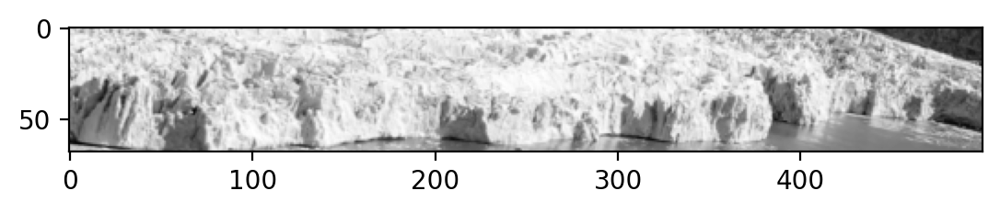

In [82]:
plt.imshow(test_data[0][0].numpy()[0], cmap='gray')


In [83]:
list(net.vggFeatures.children())[0](calving_test[0].to(device)).shape

torch.Size([64, 68, 500])

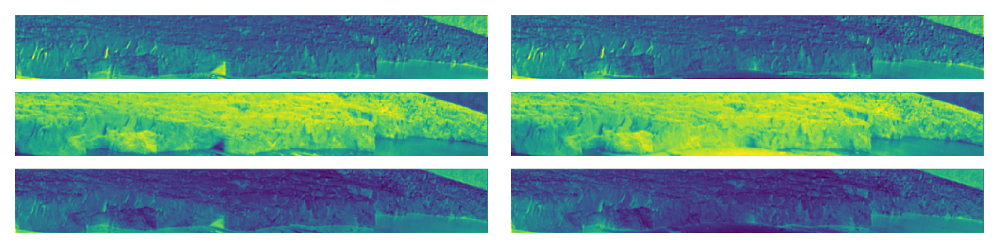

In [328]:

out_l = list(net.vggFeatures.children())[0](calving_test[0].to(device)).detach().cpu().numpy()
out_r = list(net.vggFeatures.children())[0](calving_test[1].to(device)).detach().cpu().numpy()


plt.figure(figsize=(18,10), dpi=300)
plt.subplots_adjust(left=0.05,
            bottom=0.05,
            right=0.4,
            top=0.4,
            wspace=0.05,
            hspace=0.01)

for i, x in enumerate(zip(np.array(out_l)[[10,22,41]], np.array(out_r)[[10,22,41]])):
    plt.subplot(7, 2, 2*i+1)
    plt.axis("off")
    plt.imshow(x[0])
    plt.subplot(7, 2, 2*i+2)
    plt.axis("off")
    plt.imshow(x[1])
    # plt.text(0,0, str(i))
#plt.savefig('feature-map.png', dpi=400)

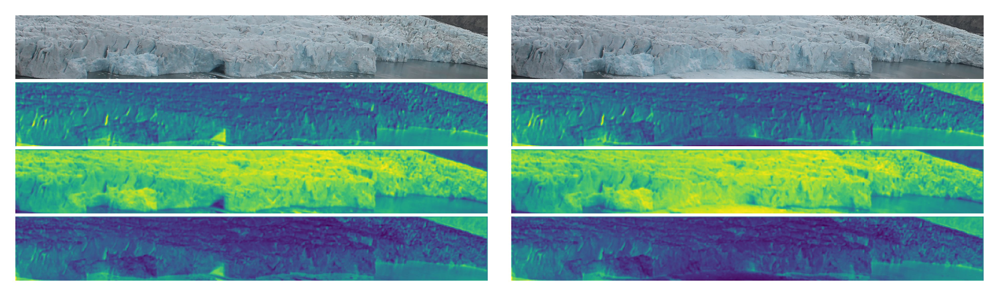

In [331]:
l = transforms.ToTensor()(Image.open(train_data.content_root+'20160713_0108_IMG_4630.JPG')).permute(1, 2, 0).cpu().numpy()
r = transforms.ToTensor()(Image.open(train_data.content_root+'20160713_0123_IMG_4631.JPG')).permute(1, 2, 0).cpu().numpy()

plt.figure(figsize=(18,10), dpi=300)
plt.subplots_adjust(left=0.05,
            bottom=0.05,
            right=0.4,
            top=0.4,
            wspace=0.05,
            hspace=0.01)

plt.subplot(8, 2, 1)
plt.axis("off")
plt.imshow(l)

plt.subplot(8, 2, 2)
plt.axis("off")
plt.imshow(r)
for i, x in enumerate(zip(np.array(out_l)[[10,22,41]], np.array(out_r)[[10,22,41]])):
    plt.subplot(8, 2, 2*i+3)
    plt.axis("off")
    plt.imshow(x[0])
    plt.subplot(8, 2, 2*i+4)
    plt.axis("off")
    plt.imshow(x[1])
plt.savefig('feature-map.png', dpi=400)

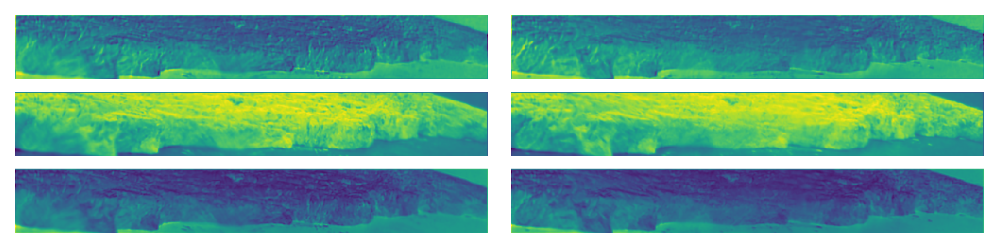

In [85]:
l = train_data.transform(Image.open(train_data.content_root+'20160703_1748_IMG_3734.JPG'))
r = train_data.transform(Image.open(train_data.content_root+'20160703_1803_IMG_3735.JPG'))

out_l = list(net.vggFeatures.children())[0](l.to(device)).detach().cpu().numpy()
out_r = list(net.vggFeatures.children())[0](r.to(device)).detach().cpu().numpy()

plt.figure(figsize=(18,10), dpi=300)
plt.subplots_adjust(left=0.05,
            bottom=0.05,
            right=0.4,
            top=0.4,
            wspace=0.05,
            hspace=0.01)

for i, x in enumerate(zip(np.array(out_l)[[10,22,41]], np.array(out_r)[[10,22,41]])):
    plt.subplot(7, 2, 2*i+1)
    plt.axis("off")
    plt.imshow(x[0])
    plt.subplot(7, 2, 2*i+2)
    plt.axis("off")
    plt.imshow(x[1])

In [86]:
a = transform(Image.open(train_data.content_root+'20160713_0108_IMG_4630.JPG')).cpu().numpy()[0]
b = transform(Image.open(train_data.content_root+'20160713_0123_IMG_4631.JPG')).cpu().numpy()[0]
plot_img(1, 5, True, a, b)

NameError: name 'transform' is not defined

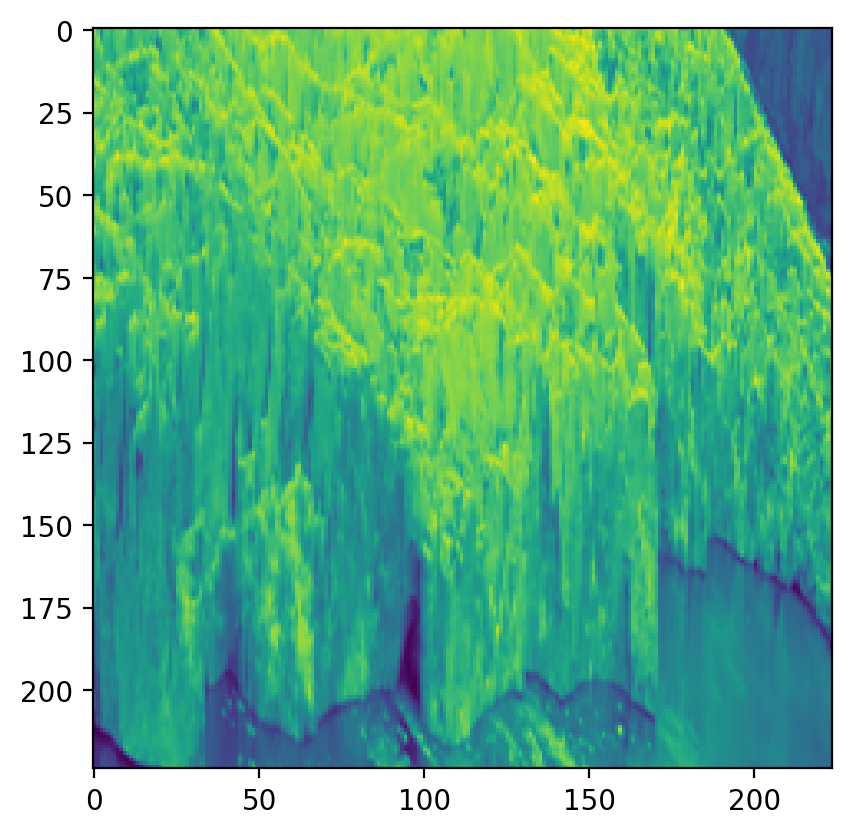

In [ ]:
transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
out = net.vggFeatures(transform(Image.open(train_data.content_root+'20160713_0108_IMG_4630.JPG')).to(device)).detach().cpu().numpy()
features_avg = [np.mean(x) for x in out]
# plt.imshow((out[np.argsort(features_avg)[-2]])/(out[np.argsort(features_avg)[-2]]).max())
# plt.imshow((out[np.argsort(features_avg)[-2]]))
plt.imshow(transform(Image.open(train_data.content_root+'20160713_0108_IMG_4630.JPG')).numpy()[0])

In [ ]:
raise SystemExit("Stop")

SystemExit: Stop

/Users/lakhanmankani/University/PRBX/detector/.venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3468: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


## Extra

In [ ]:
import torchsummary
torchsummary.summary(torchvision.models.vgg11(weights=torchvision.models.VGG11_Weights.IMAGENET1K_V1).to('cpu'), (3, 68, 500))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 64, 68, 500]           1,792
              ReLU-2          [-1, 64, 68, 500]               0
         MaxPool2d-3          [-1, 64, 34, 250]               0
            Conv2d-4         [-1, 128, 34, 250]          73,856
              ReLU-5         [-1, 128, 34, 250]               0
         MaxPool2d-6         [-1, 128, 17, 125]               0
            Conv2d-7         [-1, 256, 17, 125]         295,168
              ReLU-8         [-1, 256, 17, 125]               0
            Conv2d-9         [-1, 256, 17, 125]         590,080
             ReLU-10         [-1, 256, 17, 125]               0
        MaxPool2d-11           [-1, 256, 8, 62]               0
           Conv2d-12           [-1, 512, 8, 62]       1,180,160
             ReLU-13           [-1, 512, 8, 62]               0
           Conv2d-14           [-1, 512

In [ ]:
import torchsummary
torchsummary.summary(net.vggFeatures.to('cpu'), (3, 68, 500))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 64, 68, 500]           1,792
              ReLU-2          [-1, 64, 68, 500]               0
         MaxPool2d-3          [-1, 64, 34, 250]               0
            Conv2d-4         [-1, 128, 34, 250]          73,856
              ReLU-5         [-1, 128, 34, 250]               0
         MaxPool2d-6         [-1, 128, 17, 125]               0
            Conv2d-7         [-1, 256, 17, 125]         295,168
              ReLU-8         [-1, 256, 17, 125]               0
            Conv2d-9         [-1, 256, 17, 125]         590,080
             ReLU-10         [-1, 256, 17, 125]               0
        MaxPool2d-11           [-1, 256, 8, 62]               0
           Conv2d-12           [-1, 512, 8, 62]       1,180,160
             ReLU-13           [-1, 512, 8, 62]               0
           Conv2d-14           [-1, 512

In [ ]:
torchsummary.summary(net.vggFeatures.to('cpu'), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
         MaxPool2d-3         [-1, 64, 112, 112]               0
            Conv2d-4        [-1, 128, 112, 112]          73,856
              ReLU-5        [-1, 128, 112, 112]               0
         MaxPool2d-6          [-1, 128, 56, 56]               0
            Conv2d-7          [-1, 256, 56, 56]         295,168
              ReLU-8          [-1, 256, 56, 56]               0
            Conv2d-9          [-1, 256, 56, 56]         590,080
             ReLU-10          [-1, 256, 56, 56]               0
        MaxPool2d-11          [-1, 256, 28, 28]               0
           Conv2d-12          [-1, 512, 28, 28]       1,180,160
             ReLU-13          [-1, 512, 28, 28]               0
           Conv2d-14          [-1, 512,

In [ ]:
import torchsummary
torchsummary.summary(net.to('cpu'), [(3, 68, 500), (3, 68, 500)])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 64, 68, 500]           1,792
            Conv2d-2          [-1, 64, 68, 500]           1,792
              ReLU-3          [-1, 64, 68, 500]               0
              ReLU-4          [-1, 64, 68, 500]               0
         MaxPool2d-5          [-1, 64, 34, 250]               0
         MaxPool2d-6          [-1, 64, 34, 250]               0
            Conv2d-7         [-1, 128, 34, 250]          73,856
            Conv2d-8         [-1, 128, 34, 250]          73,856
              ReLU-9         [-1, 128, 34, 250]               0
             ReLU-10         [-1, 128, 34, 250]               0
        MaxPool2d-11         [-1, 128, 17, 125]               0
        MaxPool2d-12         [-1, 128, 17, 125]               0
           Conv2d-13         [-1, 256, 17, 125]         295,168
           Conv2d-14         [-1, 256, 

In [ ]:
def normalize(t):
    t -= t.min(1, keepdim=True)[0]
    t /= t.max(1, keepdim=True)[0]
    return t

In [ ]:
def show_torch_img(img):
    img -= img.min(1, keepdim=True)[0]
    img /= img.max(1, keepdim=True)[0]
    img = np.moveaxis(img.detach().numpy(), 0, -1)
    print(img.min(), img.max())
    plt.imshow(img)

In [ ]:
# torch.save(net.state_dict(), 'v2.pth')